In [1]:
import sys
import os




project_path = r"C:\Users\lamin\Documents\maitrise\ASTD\TrackBuilder"
if project_path not in sys.path:
    sys.path.append(project_path)

import track_builder as tb

import pandas as pd
import track_builder as tb

import os
from dotenv import load_dotenv

load_dotenv()


BASE_PATH = r"C:\Users\lamin\Documents\maitrise\ASTD\data"
YEAR      = 2019

MONTHS_TO_LOAD = [1, 2, 3, 4]

USECOLS   = "default"
SAMPLING  = [0, -1]

COLS_REQUIRED = [
    "shipid",
    "date_time_utc",
    "latitude",
    "longitude",
    "astd_cat",
    "flagname",
    "iceclass",
    "sizegroup_gt"
]


In [2]:
import os
from dotenv import load_dotenv

load_dotenv()

saving_path = os.getenv("SAVING")
track_output_path = os.path.join(saving_path, "tracks")
df_output_path = os.path.join(saving_path, "df")
os.makedirs(track_output_path, exist_ok=True)
os.makedirs(df_output_path, exist_ok=True)

In [3]:
df_parquet_file = os.path.join(df_output_path, "df_for_track_test_score.parquet")
if os.path.exists(df_parquet_file):
    df_for_track = pd.read_parquet(df_parquet_file)
else:
    df_for_track = tb.load_astd_monthly(
        BASE_PATH, YEAR, months=MONTHS_TO_LOAD, progress=True,
        usecols=USECOLS, sampling=SAMPLING, remove_nan_rows=COLS_REQUIRED
    )

    
    df_for_track.to_parquet(df_parquet_file, index=False)

In [4]:
df_parquet_file2 = os.path.join(df_output_path, "all_df_for_test_score.parquet")
if os.path.exists(df_parquet_file2):
    df = pd.read_parquet(df_parquet_file2)
else:
    df = tb.load_astd_monthly(
        BASE_PATH, YEAR, months=MONTHS_TO_LOAD, progress=True,
        usecols=USECOLS, sampling=None, remove_nan_rows=COLS_REQUIRED
    )
    
    df.to_parquet(df_parquet_file2, index=False)

df

,shipid,date_time_utc,flagname,iceclass,astd_cat,sizegroup_gt,dist_nextpoint,sec_nextpoint,longitude,latitude
0,5966,2019-01-01 00:00:02+00:00,Russia,FS Ice Class 1A,General cargo ships,10000 - 24999,616.758301,971,72.985146,73.034294
1,3994,2019-01-01 00:00:02+00:00,Norway,FS Ice Class 1C,Offshore supply ships,1000 - 4999 GT,8.541162,371,5.850370,62.335602
2,3768,2019-01-01 00:00:02+00:00,Netherlands,FS Ice Class 1C,Other service offshore vessels,10000 - 24999,0.000000,718,7.734500,63.110500
3,1892,2019-01-01 00:00:04+00:00,Russia,FS Ice Class 1C,Fishing vessels,< 1000 GT,1.028629,540,29.700306,70.626442
4,3009,2019-01-01 00:00:04+00:00,Norway,FS Ice Class 1C,Fishing vessels,< 1000 GT,1945.192749,371,25.147583,70.990837
...,...,...,...,...,...,...,...,...,...,...
14305839,6556,2019-04-30 23:59:54+00:00,Cyprus,FS Ice Class 1A,Container ships,10000 - 24999,1226.629028,210,23.807863,65.276199
14305840,12580,2019-04-30 23:59:55+00:00,Cyprus,FS Ice Class 1A,General cargo ships,1000 - 4999 GT,4.734151,360,21.275877,64.670944
14305841,15295,2019-04-30 23:59:58+00:00,Antigua & Barbuda,FS Ice Class 1A,General cargo ships,5000 - 9999 GT,284.300659,41,20.490366,63.116634
14305842,14711,2019-04-30 23:59:58+00:00,Barbados,FS Ice Class II,General cargo ships,1000 - 4999 GT,1.162097,360,9.639557,63.816971


In [5]:
parquet_file_path = os.path.join(track_output_path, "tracks_for_test_score.parquet")
if os.path.exists(parquet_file_path):
    tracks = pd.read_parquet(parquet_file_path)
else:
    tracks, logs = tb.build_ship_tracks(df_for_track,
                                  max_time_gap_hours=25,
                                  max_distance_km=400,
                                  min_track_length=1,
                                  matching_strategy="balanced",
                                  return_logs=True,
                                  )
    tracks.to_parquet(parquet_file_path)

tracks

,month,segment_id,track_id
0,2019-01,3768,1
1,2019-01,5966,2
2,2019-02,2903,2
3,2019-03,3125,2
4,2019-04,5641,2
...,...,...,...
6824,2019-04,15250,4920
6825,2019-04,15276,4921
6826,2019-04,15242,4922
6827,2019-04,15318,4923


In [6]:
# tracks that span at least 3 months
month_counts = tracks.groupby("track_id")["month"].nunique()
multi_month_ids = month_counts[month_counts >= 2].index

print("Number of tracks spanning at least 2 months of data:", len(multi_month_ids))
tracks_more_than_2 = tracks[tracks["track_id"].isin(multi_month_ids)]

tracks_more_than_2.head(10)

Number of tracks spanning at least 2 months of data: 1126


,month,segment_id,track_id
1,2019-01,5966,2
2,2019-02,2903,2
3,2019-03,3125,2
4,2019-04,5641,2
5,2019-01,3994,3
6,2019-02,3742,3
7,2019-03,4018,3
8,2019-04,4705,3
9,2019-01,1541,4
10,2019-02,1418,4


In [7]:

target_segment_id = 5966  
target_month = '2019-01'   

candidates_df, logs_df = tb.find_track_candidates(
    segment_id=target_segment_id,
    month=target_month,
    astd_data=df_for_track,
    
    max_time_gap_hours=25,
    max_distance_km=400,
    matching_strategy="balanced",  
    
    w_time=0.4,
    w_dist=0.4,
    w_speed=0.2,
    
    gap_days_no_penalty=3.0,      #
    gap_penalty_per_day=0.05,
    
    top_n=5,
    return_logs=True
)

print(f"--- Top Candidates for Segment {target_segment_id} ---")

display(candidates_df)

print("\n--- Exclusion Logs (Why other candidates were rejected) ---")

if not logs_df.empty:
    display(logs_df)

Data after cleaning:
  Date range: 2019-01-01 00:00:02+00:00 to 2019-04-30 23:59:58+00:00
  Ship types: ['other service offshore vessels' 'offshore supply ships'
 'general cargo ships' 'passenger ships' 'fishing vessels' 'bulk carriers'
 'other activities' 'ro-ro cargo ships' 'cruise ships'
 'refrigerated cargo ships' 'chemical tankers' 'container ships'
 'gas tankers' 'crude oil tankers' 'oil product tankers']
  Unique ships: 3367


C:\Users\lamin\Documents\maitrise\ASTD\TrackBuilder\track_builder\core\track_helpers.py:230: UserWarning: Converting to PeriodArray/Index representation will drop timezone information.
  df['period_month'] = df['date_time_utc'].dt.to_period('M')


Creating segments for 4106 unique ship-months (segments)...
Successfully created 4106 monthly segments.
Sample segment: fishing vessels|russia|fs ice class 1c|< 1000 gt in 2019-04
--- Top Candidates for Segment 5966 ---


C:\Users\lamin\Documents\maitrise\ASTD\TrackBuilder\track_builder\core\track_helpers.py:382: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  out = (ship_means.groupby('astd_cat')


,month,segment_id,match_score_simple,distance_km_fd,implied_v_kmh,dt_hours
0,2019-02,2903,0.164911,5.768068,13.992617,0.412222



--- Exclusion Logs (Why other candidates were rejected) ---


,match_id,from_shipid,to_shipid,from_month,to_month,stage,reason,dt_hours,distance_km_fd,implied_v_kmh
0,5966→13249,5966,13249,2019-01,2019-02,filter,distance_window,0.297500,1769.102417,NaN
1,5966→1736,5966,1736,2019-01,2019-02,filter,distance_window,0.297500,3134.202393,NaN
2,5966→3008,5966,3008,2019-01,2019-02,filter,distance_window,0.297500,2411.511963,NaN
3,5966→7210,5966,7210,2019-01,2019-02,filter,distance_window,0.297500,2415.482422,NaN
4,5966→3183,5966,3183,2019-01,2019-02,filter,distance_window,0.297500,2303.414307,NaN
...,...,...,...,...,...,...,...,...,...,...
757,5966→3311,5966,3311,2019-01,2019-02,filter,speed_cap,0.403611,197.804581,490.087055
758,5966→7947,5966,7947,2019-01,2019-02,filter,speed_cap,0.427222,207.902679,486.638261
759,5966→3245,5966,3245,2019-01,2019-02,filter,speed_cap,0.438056,180.832764,412.807831
760,5966→5596,5966,5596,2019-01,2019-02,filter,speed_cap,0.792778,109.613647,138.265288


In [31]:


# # candidates_df.shape[0]

new_tracks_more_than_2 = tracks_more_than_2[tracks_more_than_2["month"] == "2019-01"]

# tracks_segment_id = new_tracks_more_than_2['segment_id']

# same_first_candidate_as_buildShiptracks = 0

# target_month = '2019-01' 

# save_track_candidates = {}
# for segment_id in tracks_segment_id:
#     target_segment_id = segment_id  
      

#     candidates_df = tb.find_track_candidates(
#         segment_id=target_segment_id,
#         month=target_month,
#         astd_data=df_for_track,
        
#         max_time_gap_hours=25,
#         max_distance_km=400,
#         matching_strategy="balanced",  
        
#         w_time=0.1,
#         w_dist=0.4,
#         w_speed=0.5,
        
#         gap_days_no_penalty=3.0,      #
#         gap_penalty_per_day=0.05,
        
#         top_n=5,
#         return_logs=False
#     )

#     if candidates_df.shape[0] > 1:
   
#         save_track_candidates[segment_id] = candidates_df
#         track = tracks[(tracks["segment_id"] == save_track_candidates[target_segment_id].iloc[0, 1]) & (tracks["month"] == save_track_candidates[target_segment_id].iloc[0, 0])]

#         if not track.empty:
#             same_first_candidate_with_tracks = same_first_candidate_with_tracks + 1

print(f"Number of segment use : {len(new_tracks_more_than_2)}")

Number of segment use : 632


In [9]:
df_parquet_for_score_analysis = os.path.join(df_output_path, "df_for_test_score_analysis.parquet")

# df_final = pd.concat(save_track_candidates.values(), 
#                      keys=save_track_candidates.keys(), 
#                      names=['original_segment_id'])

# # 2. On remet l'index à plat (nécessaire pour le format Parquet)
# df_final = df_final.reset_index(level=0)

# # 3. Sauvegarde
# df_final.to_parquet(df_parquet_for_score_analysis)

# print("Sauvegarde terminée ! Tu peux éteindre le noyau.")

In [10]:
df_track_for_test = pd.read_parquet(df_parquet_for_score_analysis)

df

,shipid,date_time_utc,flagname,iceclass,astd_cat,sizegroup_gt,dist_nextpoint,sec_nextpoint,longitude,latitude
0,5966,2019-01-01 00:00:02+00:00,Russia,FS Ice Class 1A,General cargo ships,10000 - 24999,616.758301,971,72.985146,73.034294
1,3994,2019-01-01 00:00:02+00:00,Norway,FS Ice Class 1C,Offshore supply ships,1000 - 4999 GT,8.541162,371,5.850370,62.335602
2,3768,2019-01-01 00:00:02+00:00,Netherlands,FS Ice Class 1C,Other service offshore vessels,10000 - 24999,0.000000,718,7.734500,63.110500
3,1892,2019-01-01 00:00:04+00:00,Russia,FS Ice Class 1C,Fishing vessels,< 1000 GT,1.028629,540,29.700306,70.626442
4,3009,2019-01-01 00:00:04+00:00,Norway,FS Ice Class 1C,Fishing vessels,< 1000 GT,1945.192749,371,25.147583,70.990837
...,...,...,...,...,...,...,...,...,...,...
14305839,6556,2019-04-30 23:59:54+00:00,Cyprus,FS Ice Class 1A,Container ships,10000 - 24999,1226.629028,210,23.807863,65.276199
14305840,12580,2019-04-30 23:59:55+00:00,Cyprus,FS Ice Class 1A,General cargo ships,1000 - 4999 GT,4.734151,360,21.275877,64.670944
14305841,15295,2019-04-30 23:59:58+00:00,Antigua & Barbuda,FS Ice Class 1A,General cargo ships,5000 - 9999 GT,284.300659,41,20.490366,63.116634
14305842,14711,2019-04-30 23:59:58+00:00,Barbados,FS Ice Class II,General cargo ships,1000 - 4999 GT,1.162097,360,9.639557,63.816971


In [28]:
# 1. Obtenir la liste des segments uniques
unique_segments = df_track_for_test['original_segment_id'].unique()

num_segments = len(unique_segments)
print("The number of segment use : ", num_segments)

i = 0
print('some of the segment and their candidates')

# 3. Boucler sur les groupes au lieu du dictionnaire
# df_results.groupby('original_segment_id') remplace save_track_candidates.items()
for segment_id, candidates_df in df_track_for_test.groupby('original_segment_id'):
    
    if i == 5:
        break
        
    print("\n")
    print(f"Candidates for segment {segment_id} in month 2019-01 ")
    
    # Affichage du dataframe partiel
    display(candidates_df)
    
    print('------------------------------------------------------')
    i += 1

The number of segment use :  128
some of the segment and their candidates


Candidates for segment 1632 in month 2019-01 


,original_segment_id,month,segment_id,match_score_simple,distance_km_fd,implied_v_kmh,dt_hours
0,1632,2019-02,1968,0.108454,7.959661,1.934696,4.114167
1,1632,2019-02,1644,0.213529,17.082315,4.142841,4.123333
2,1632,2019-02,1676,0.334970,27.512987,6.700044,4.106389


------------------------------------------------------


Candidates for segment 1730 in month 2019-01 


,original_segment_id,month,segment_id,match_score_simple,distance_km_fd,implied_v_kmh,dt_hours
0,1730,2019-02,1604,0.000751,0.001289,0.008623,0.149444
1,1730,2019-02,1761,0.047155,0.906761,2.540341,0.356944


------------------------------------------------------


Candidates for segment 1773 in month 2019-01 


,original_segment_id,month,segment_id,match_score_simple,distance_km_fd,implied_v_kmh,dt_hours
0,1773,2019-02,1676,0.083847,4.055356,1.604140,2.528056
1,1773,2019-02,1644,0.237666,12.590775,4.947259,2.545000
2,1773,2019-02,1968,0.668680,36.324245,14.324382,2.535833


------------------------------------------------------


Candidates for segment 1779 in month 2019-01 


,original_segment_id,month,segment_id,match_score_simple,distance_km_fd,implied_v_kmh,dt_hours
0,1779,2019-02,1649,0.000864,0.000765,0.005121,0.149444
1,1779,2019-02,1464,0.818262,221.497742,9.769445,22.672500


------------------------------------------------------


Candidates for segment 1792 in month 2019-01 


,original_segment_id,month,segment_id,match_score_simple,distance_km_fd,implied_v_kmh,dt_hours
0,1792,2019-02,2834,0.360442,56.525143,6.150351,9.190556
1,1792,2019-02,2970,0.449335,72.461563,7.823345,9.262222
2,1792,2019-02,2814,0.454312,72.825340,7.937607,9.174722
3,1792,2019-02,3008,0.460880,73.944183,8.063462,9.170278
4,1792,2019-02,1793,0.476359,77.510460,8.324761,9.310833


------------------------------------------------------


In [30]:
import pandas as pd
import plotly.graph_objects as go

plot_limit = 10
current_count = 0
df = tb.remove_unrealistic_points(df)
for segment_id, candidates_df in df_track_for_test.groupby('original_segment_id'):
    
    if current_count >= plot_limit:
        break
        
    print(f"\n--- Analysis for Source Segment: {segment_id} ---")

    df_source = df[(df['shipid'] == segment_id) & (df['date_time_utc'].dt.month == 1)].copy()
    df_source['display_group'] = f"SOURCE ({segment_id})"
    
   
    candidate_ids = candidates_df['segment_id'].tolist()
    
    df_cands = df[df['shipid'].isin(candidate_ids) & (df['date_time_utc'].dt.month == 2)].copy()
    
   
    cand_info = candidates_df.set_index('segment_id')['match_score_simple'].to_dict()
    
    df_cands['display_group'] = df_cands['shipid'].apply(
        lambda x: f"Cand (ID:{x}) - Score: {cand_info.get(x, 0):.4f}"
    )
    
    df_viz = pd.concat([df_source, df_cands])
    df_viz['track_id'] = df_viz['display_group']
    
    try:
        fig = tb.plot_ship_tracks(
            df_viz,
            show_points=False,
            show_start_end=True,
            color_by="display_group",
            title=f"Source {segment_id} vs Candidates | Best Score: {candidates_df['match_score_simple'].min():.4f}",
            map_style="open-street-map",
        )
        fig.show()
    except Exception as e:
        print(f"Erreur lors du plot pour {segment_id}: {e}")

    current_count += 1

computing typical speeds...


C:\Users\lamin\Documents\maitrise\ASTD\TrackBuilder\track_builder\core\track_helpers.py:382: FutureWarning:

The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.

C:\Users\lamin\Documents\maitrise\ASTD\TrackBuilder\track_builder\core\track_helpers.py:170: FutureWarning:

Downcasting object dtype arrays on .fillna, .ffill, .bfill is deprecated and will change in a future version. Call result.infer_objects(copy=False) instead. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`



Cleaning completed: 6331 'ghost' or aberrant points removed.

--- Analysis for Source Segment: 1632 ---



--- Analysis for Source Segment: 1730 ---



--- Analysis for Source Segment: 1773 ---



--- Analysis for Source Segment: 1779 ---



--- Analysis for Source Segment: 1792 ---



--- Analysis for Source Segment: 1795 ---



--- Analysis for Source Segment: 1802 ---



--- Analysis for Source Segment: 1804 ---



--- Analysis for Source Segment: 1806 ---



--- Analysis for Source Segment: 1845 ---


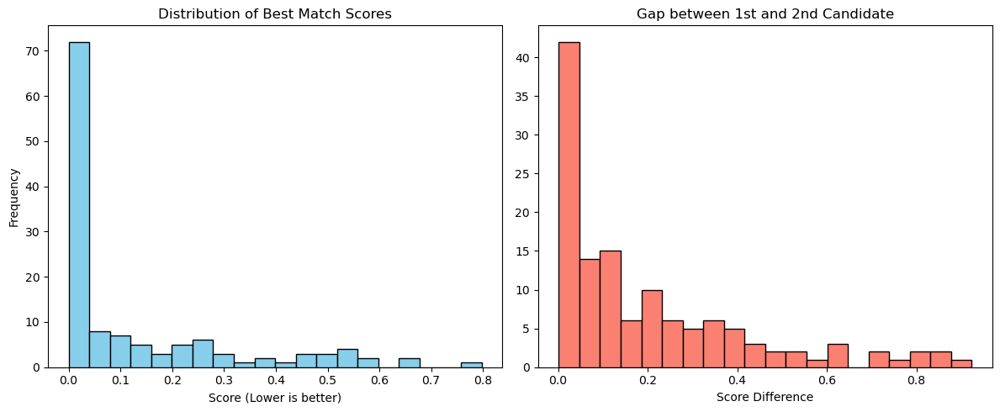

In [22]:
import matplotlib.pyplot as plt

all_scores = []
score_diffs = []

df_sorted = df_track_for_test.sort_values(['original_segment_id', 'match_score_simple'])
for segment_id, candidates_df in df_track_for_test.groupby('original_segment_id'):
    
    best_score = candidates_df.iloc[0]['match_score_simple']
    all_scores.append(best_score)
    
    if len(candidates_df) > 1:
        diff = candidates_df.iloc[1]['match_score_simple'] - best_score
        score_diffs.append(diff)

plt.figure(figsize=(12, 5))

plt.subplot(1, 2, 1)
plt.hist(all_scores, bins=20, color='skyblue', edgecolor='black')
plt.title("Distribution of Best Match Scores")
plt.xlabel("Score (Lower is better)")
plt.ylabel("Frequency")

plt.subplot(1, 2, 2)
plt.hist(score_diffs, bins=20, color='salmon', edgecolor='black')
plt.title("Gap between 1st and 2nd Candidate")
plt.xlabel("Score Difference")

plt.tight_layout()
plt.show()

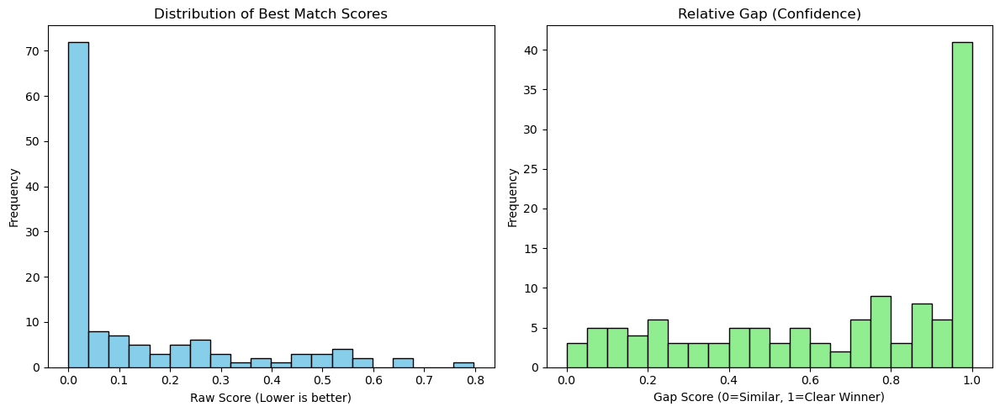

In [ ]:
import matplotlib.pyplot as plt
import numpy as np

# Analysis: Distribution of scores
all_scores = []
relative_gaps = [] 

for segment_id, candidates_df in df_track_for_test.groupby('original_segment_id'):
    
    # 1. Collect the best score
    best_score = candidates_df.iloc[0]['match_score_simple']
    all_scores.append(best_score)
    
    # 2. Calculate the RELATIVE GAP
    if len(candidates_df) > 1:
        second_score = candidates_df.iloc[1]['match_score_simple']
      
        # Formula: What % error does the 2nd have compared to the 1st?
        # A value close to 1 means the 1st is MUCH better (e.g., 0.001 vs 0.05)
        # A value close to 0 means they are similar (e.g., 0.8 vs 0.81)
        rel_diff = (second_score - best_score) / second_score
        relative_gaps.append(rel_diff)

plt.figure(figsize=(12, 5))

# Plot 1 
plt.subplot(1, 2, 1)
plt.hist(all_scores, bins=20, color='skyblue', edgecolor='black')
plt.title("Distribution of Best Match Scores")
plt.xlabel("Raw Score (Lower is better)")
plt.ylabel("Frequency")

# Plot 2 
plt.subplot(1, 2, 2)

plt.hist(relative_gaps, bins=20, range=(0, 1), color='lightgreen', edgecolor='black')
plt.title("Relative Gap (Confidence)")
plt.xlabel("Gap Score (0=Similar, 1=Clear Winner)")
plt.ylabel("Frequency")

plt.tight_layout()
plt.show()

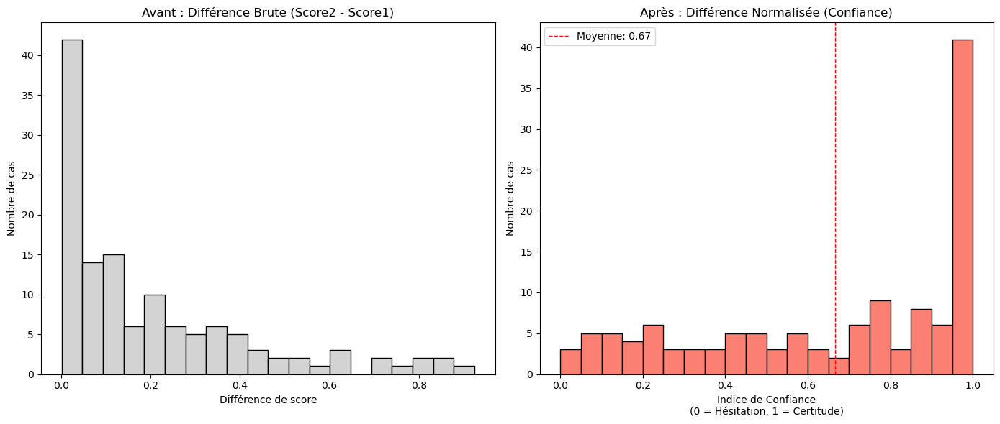

In [ ]:
import matplotlib.pyplot as plt
import pandas as pd
import numpy as np

normalized_diffs = []
raw_diffs = []


for segment_id, candidates_df in df_track_for_test.groupby('original_segment_id'):
    
    if len(candidates_df) > 1:
        
        best_score = candidates_df.iloc[0]['match_score_simple']
        second_score = candidates_df.iloc[1]['match_score_simple']
        
        diff = second_score - best_score
        raw_diffs.append(diff)
        
        # Formule : (Second - Best) / Second
        
        if second_score > 0:
            norm_diff = (second_score - best_score) / second_score
            normalized_diffs.append(norm_diff)


plt.figure(figsize=(14, 6))

# Graph : simple diff
plt.subplot(1, 2, 1)
plt.hist(raw_diffs, bins=20, color='lightgray', edgecolor='black')
plt.title("Avant : Différence Brute (Score2 - Score1)")
plt.xlabel("Différence de score")
plt.ylabel("Nombre de cas")

# Graph 2 : diff normalise
plt.subplot(1, 2, 2)
plt.hist(normalized_diffs, bins=20, range=(0, 1), color='salmon', edgecolor='black')
plt.title("Après : Différence Normalisée (Confiance)")
plt.xlabel("Indice de Confiance\n(0 = Hésitation, 1 = Certitude)")
plt.ylabel("Nombre de cas")

# Add line to see the avg
plt.axvline(np.mean(normalized_diffs), color='red', linestyle='dashed', linewidth=1, label=f'Moyenne: {np.mean(normalized_diffs):.2f}')
plt.legend()

plt.tight_layout()
plt.show()